# Homework Answer

* Họ và tên: Nguyễn Vạn Phúc Huy 
* MSSV: 23110163

1. Choose an external image (from the internet or your computer) and complete all the above tasks.

2. Histogram Matching:
    -  Perform histogram matching on individual RGB channels separately, and then perform matching in the YCrCb or LAB color space (matching only the Y or L channel). Compare the results: which color space produces a more natural-looking image?

    - Implement iterative histogram matching, e.g., applying the matching process 2–3 times consecutively using the same reference image. Does the color change become excessive after multiple iterations?


3. Histogram Matching vs Equalization
    - Write code to compute the intensity entropy of the original, equalized, and matched images. Which image has the highest entropy (i.e., contains the most information)?

    - Apply both methods (equalization and matching) on an image with high dynamic range (strong highlights and deep shadows). Which method better restores details in dark regions?

    - Try histogram matching after equalization, and then equalization after histogram matching. How do the results differ? Explain why the order of operations affects the outcome.

    - Write code to generate histogram comparison plots (before and after processing) for each method, and provide a quantitative assessment of average contrast.
    

4. Local Histogram Matching
    - Compare the global histogram of the image after local matching with that of the original image. Are there any significant changes?

    - Compare local histogram matching results with global histogram matching. Which approach produces better details in dark or bright regions?

    - Implement CLAHE (Contrast Limited Adaptive Histogram Equalization) using cv2 or skimage, and compare its results with your own local histogram matching method.

    - Combine local histogram matching with adaptive gamma correction (compute a separate gamma value for each local region). Does this improve detail visibility in bright and dark areas


5. Report
    - Display the original image and all processed results after each transformation.

    - Write a short report summarizing the observations and conclusions for each type of transformation.

## 1. Choose an external image (from the internet or your computer) and complete all the above tasks

Import Libs

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import gdown
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from cv2 import imwrite, imread
from skimage import data, exposure, img_as_float, img_as_ubyte
from skimage import exposure
from skimage import io
from skimage.exposure import match_histograms

Getting Image

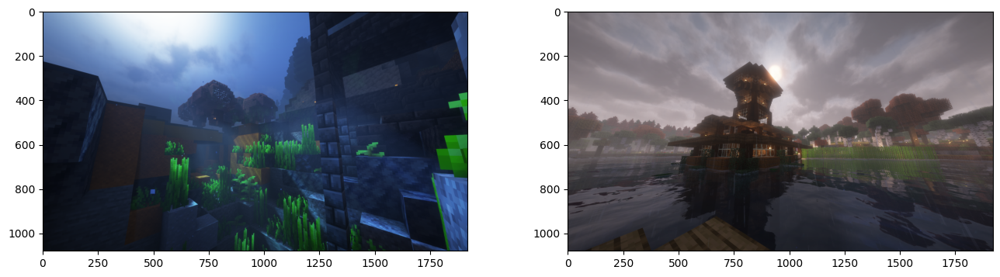

In [4]:
newImg_BGR = cv2.imread('pool.png')
newImg_RGB = cv2.cvtColor(newImg_BGR, cv2.COLOR_BGR2RGB)
copy = cv2.imread('base.png')
copy_RGB = cv2.cvtColor(copy, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.imshow(newImg_RGB)
plt.subplot(1,2,2)
plt.imshow(copy_RGB)
plt.show()


## 2. Histogram Matching
- Perform histogram matching on individual RGB channels separately, and then perform matching in the YCrCb or LAB color space (matching only the Y or L channel). Compare the results: which color space produces a more natural-looking image?

- Implement iterative histogram matching, e.g., applying the matching process 2–3 times consecutively using the same reference image. Does the color change become excessive after multiple iterations?

Perform histogram matching on individual RGB channels separately, and then perform matching in the YCrCb or LAB color space (matching only the Y or L channel). Compare the results: which color space produces a more natural-looking image?


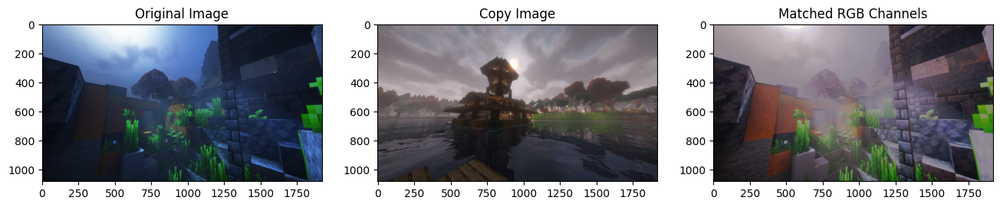

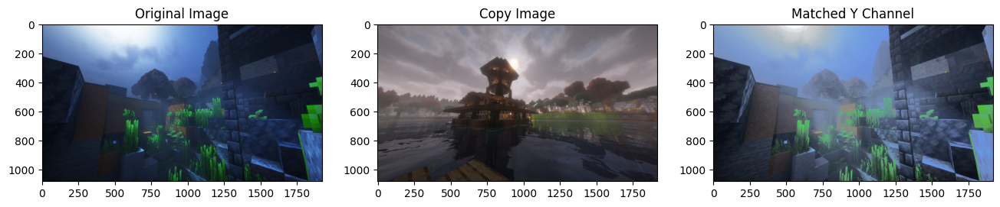

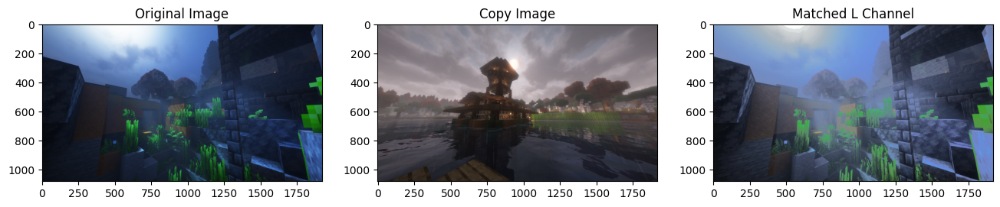

In [ ]:
def histogramMatchingRGB(main, copy):
    matchedRGB = np.zeros_like(newImg_RGB)
    for i in range(3):
        matchedRGB[:, :, i] = exposure.match_histograms(newImg_RGB[:, :, i], copy_RGB[:, :, i])
    return matchedRGB

matched_RGB = histogramMatchingRGB(newImg_RGB, copy_RGB)
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Matched RGB Channels')
plt.imshow(matched_RGB)
plt.show()

def histogramMatchingYCrCb(main, copy):
    main_YCrCb = cv2.cvtColor(main, cv2.COLOR_RGB2YCrCb)
    copy_YCrCb = cv2.cvtColor(copy, cv2.COLOR_RGB2YCrCb)
    matched_YCrCb = main_YCrCb.copy()
    matched_YCrCb[:, :, 0] = exposure.match_histograms(main_YCrCb[:, :, 0], copy_YCrCb[:, :, 0])
    matched_RGB = cv2.cvtColor(matched_YCrCb, cv2.COLOR_YCrCb2RGB)
    return matched_RGB

matched_YCrCb = histogramMatchingYCrCb(newImg_RGB, copy_RGB)

plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Matched Y Channel')
plt.imshow(matched_YCrCb)
plt.show()
def histogramMatchingLAB(main, copy):
    main_LAB = cv2.cvtColor(main, cv2.COLOR_RGB2LAB)
    copy_LAB = cv2.cvtColor(copy, cv2.COLOR_RGB2LAB)
    matched_LAB = main_LAB.copy()
    matched_LAB[:, :, 0] = exposure.match_histograms(main_LAB[:, :, 0], copy_LAB[:, :, 0])
    matched_RGB = cv2.cvtColor(matched_LAB, cv2.COLOR_LAB2RGB)
    return matched_RGB

matched_LAB = histogramMatchingLAB(newImg_RGB, copy_RGB)

plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Matched L Channel')
plt.imshow(matched_LAB)
plt.show()



# Trong 3 kết quả matching thì Matched RGB sẽ màu ít tự nhiên nhất trong 3 cái 
# Tiếp theo là tới YCrCb và cuối cùng là LAB có màu sắc tự nhiên nhất. 
# Lab cho kết quả tự nhiên nhất vì khả năng mã hóa độ sáng phi tuyến tính được thiết kế cho giống cảm nhận của mắt người hơn.

# Tham khảo: https://news.ycombinator.com/item?id=36992055

# Do Lab tốt nhất nên ta sẽ sử dụng hàm histogramMatchingLAB cho các phần sau.

Implement iterative histogram matching, e.g., applying the matching process 2–3 times consecutively using the same reference image. Does the color change become excessive after multiple iterations?

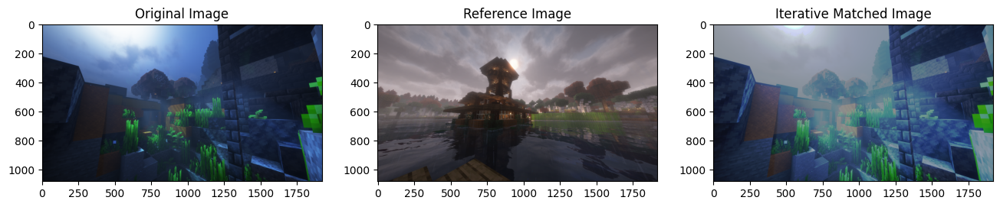

In [ ]:
def iterativeHistogramMatching(main, copy):
    matched = main.copy()
    for _ in range(3):
        matched = exposure.match_histograms(matched, copy)
    return matched.astype(np.uint8) # chuyển đổi kiểu dữ liệu về uint8 để imshow show ảnh (mất 15p vì cái này :skull:)


iterativeMatched = iterativeHistogramMatching(newImg_RGB, copy_RGB)
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Iterative Matched Image')
plt.imshow(iterativeMatched)
plt.show()

In [7]:
#  Does the color change become excessive after multiple iterations?
# Sau lắp lại 3 lần thì màu sắc của ảnh bị thay đổi giống như kỹ thuật histogram Matching RGB làm ở 2.1 trên

## 3. Histogram Matching vs Equalization
- Write code to compute the intensity entropy of the original, equalized, and matched images. Which image has the highest entropy (i.e., contains the most information)?

- Apply both methods (equalization and matching) on an image with high dynamic range (strong highlights and deep shadows). Which method better restores details in dark regions?

- Try histogram matching after equalization, and then equalization after histogram matching. How do the results differ? Explain why the order of operations affects the outcome.

- Write code to generate histogram comparison plots (before and after processing) for each method, and provide a quantitative assessment of average contrast.
    

Write code to compute the intensity entropy of the original, equalized, and matched images. Which image has the highest entropy (i.e., contains the most information)?

In [8]:
def calEntropy(image):
    # Kỹ thuật tính entropy giống bên nhận dạng mẫu mới biết :skull:
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    histogram, _ = np.histogram(gray_image, bins=256, range=(0, 256))
    histogram = histogram / np.sum(histogram)  # Chuẩn hóa histogram
    entropy = -np.sum(histogram * np.log2(histogram + 1e-10))  # Thêm epsilon để tránh log(0)
    return entropy
e = calEntropy(newImg_RGB)
equalized_image = exposure.equalize_hist(newImg_RGB)
#img_as_ubyte chuyển đổi ảnh về dạng uint8 để tính entropy
equalized_e = calEntropy(img_as_ubyte(equalized_image))
matched_e = calEntropy(matched_LAB)
print(f'OG Entropy: {e:.4f}')
print(f'Equalized Entropy: {equalized_e:.4f}')
print(f'Matched Entropy: {matched_e:.4f}')
# => Ảnh Equalized có entropy cao nhất (chứa nhiều thông tin nhất)

c:\Users\ADMIN\Documents\Image Processing & Analysis\.venv\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


OG Entropy: 7.0089
Equalized Entropy: 7.8729
Matched Entropy: 7.0746


Apply both methods (equalization and matching) on an image with high dynamic range (strong highlights and deep shadows). Which method better restores details in dark regions?


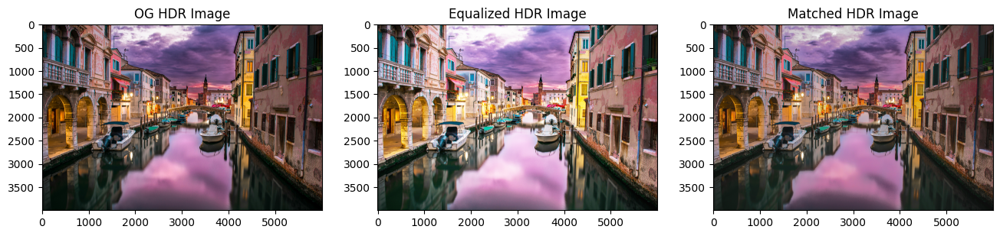

In [ ]:
newHDR_BGR = cv2.imread('HDR.png')
newHDR_RGB = cv2.cvtColor(newHDR_BGR, cv2.COLOR_BGR2RGB)
equalized_HDR = exposure.equalize_hist(newHDR_RGB)
matched_HDR = histogramMatchingLAB(newHDR_RGB, copy_RGB)
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG HDR Image')
plt.imshow(newHDR_RGB)
plt.subplot(1, 3, 2)
plt.title('Equalized HDR Image')
plt.imshow(equalized_HDR)
plt.subplot(1, 3, 3)
plt.title('Matched HDR Image')
plt.imshow(matched_HDR)
plt.show()
# => Equalization giúp phục hồi chi tiết vùng tối tốt hơn Matching



Try histogram matching after equalization, and then equalization after histogram matching. How do the results differ? Explain why the order of operations affects the outcome.

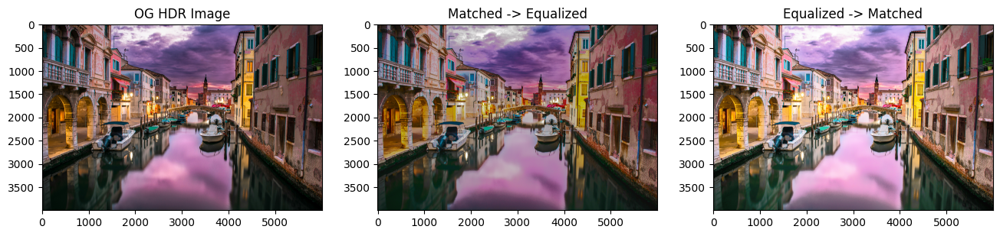

In [ ]:
newHDR_BGR = cv2.imread('HDR.png')
newHDR_RGB = cv2.cvtColor(newHDR_BGR, cv2.COLOR_BGR2RGB)
equalized_HDR = exposure.equalize_hist(newHDR_RGB)
matched_HDR = histogramMatchingLAB(newHDR_RGB, copy_RGB)

equalized_HDR_uint8 = img_as_ubyte(equalized_HDR)
matched_equalized = histogramMatchingLAB(equalized_HDR_uint8, copy_RGB)
equalize_matched = exposure.equalize_hist(matched_HDR)
plt.figure(figsize=(16,8))
plt.subplot(1, 3, 1)   
plt.title('OG HDR Image')
plt.imshow(newHDR_RGB)
plt.subplot(1, 3, 2)
plt.title('Matched -> Equalized')
plt.imshow(matched_equalized)
plt.subplot(1, 3, 3)
plt.title('Equalized -> Matched')
plt.imshow(equalize_matched)
plt.show()

# Matched -> Equalized có màu sắc giống với ảnh gốc hơn, Equalized -> Matched thì sẽ cho ảnh sáng hơn
# Equalize trước thì ảnh sẽ có độ tương phản cao hơn, làm mất một số chi tiết màu sắc ban đầu của ảnh, dẫn đến khi ta thực hiện histogram matching sau đó màu sắc đã bị mất đi do quá trình equalization trước đó.
# Matching trước thì ảnh sẽ giữ được nhiều màu sắc ban đầu hơn nên sau đó quá trình equalization sẽ cải thiện độ tương phản mà không làm mất nhiều màu sắc, dẫn đến kết quả cuối cùng trông tự nhiên hơn.

Write code to generate histogram comparison plots (before and after processing) for each method, and provide a quantitative assessment of average contrast.


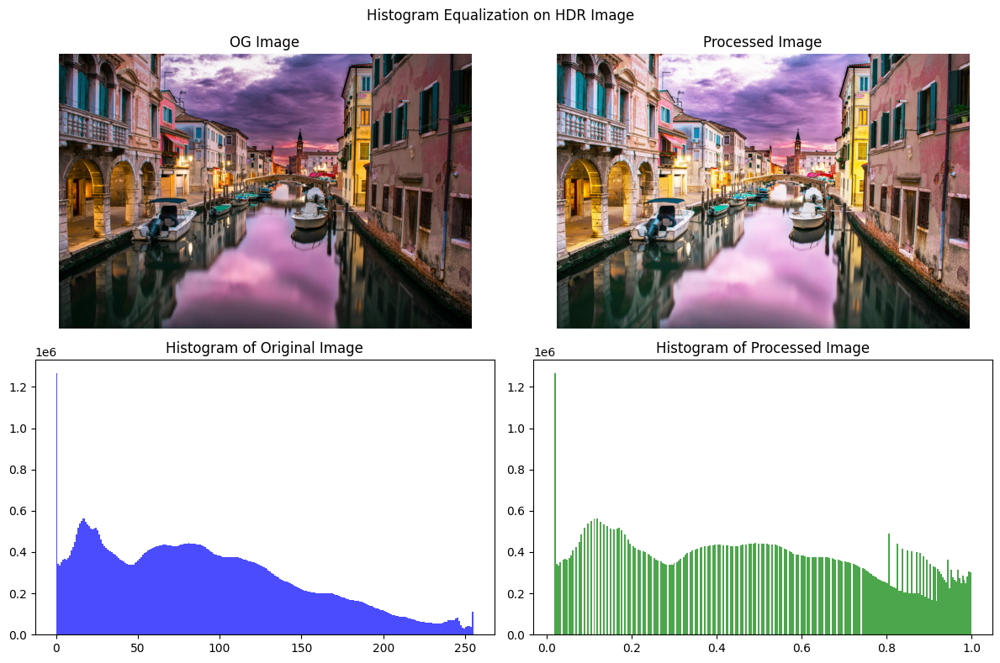

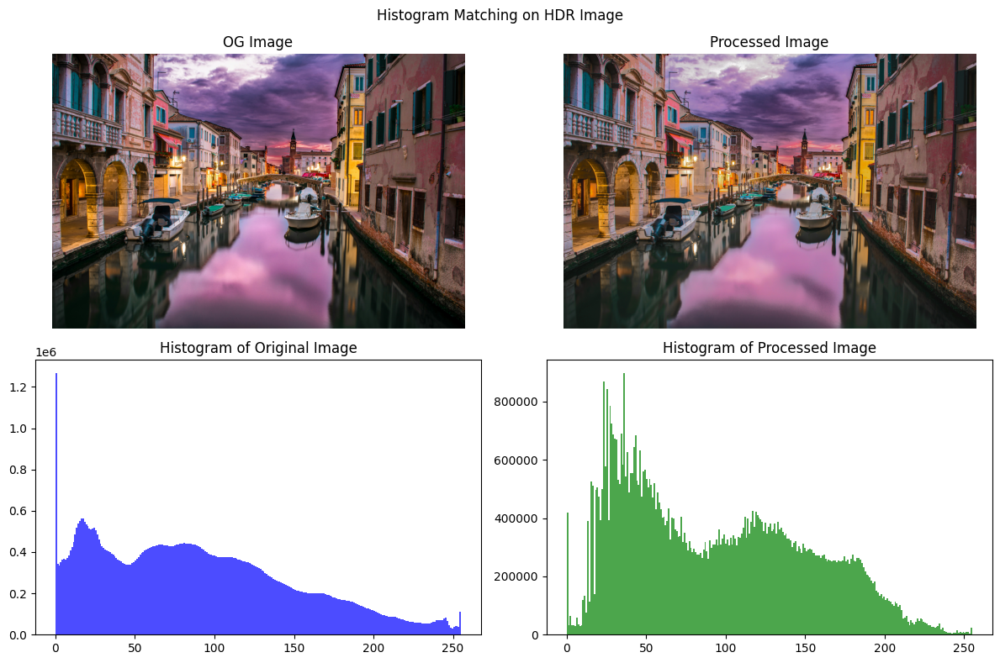

In [ ]:

def plotHistogramComparison(first, second, title):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.ravel()
    
    axes[0].imshow(first)
    axes[0].set_title('OG Image')
    axes[0].axis('off')
    
    axes[1].imshow(second)
    axes[1].set_title('Processed Image')
    axes[1].axis('off')
    
    axes[2].hist(first.ravel(), bins=256, color='blue', alpha=0.7)
    axes[2].set_title('Histogram of Original Image')
    
    axes[3].hist(second.ravel(), bins=256, color='green', alpha=0.7)
    axes[3].set_title('Histogram of Processed Image')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
plotHistogramComparison(newHDR_RGB, equalized_HDR, 'Histogram Equalization on HDR Image')
plotHistogramComparison(newHDR_RGB, matched_HDR, 'Histogram Matching on HDR Image')

## 4. Local Histogram Matching
- Compare the global histogram of the image after local matching with that of the original image. Are there any significant changes?

- Compare local histogram matching results with global histogram matching. Which approach produces better details in dark or bright regions?

- Implement CLAHE (Contrast Limited Adaptive Histogram Equalization) using cv2 or skimage, and compare its results with your own local histogram matching method.

- Combine local histogram matching with adaptive gamma correction (compute a separate gamma value for each local region). Does this improve detail visibility in bright and dark areas


Compare the global histogram of the image after local matching with that of the original image. Are there any significant changes?


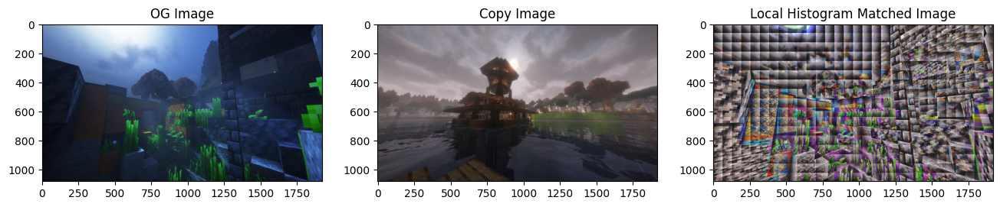

In [ ]:
def local_histogram_match(src, ref, tile_size=64):
    src = img_as_float(src)
    ref = img_as_float(ref)

    h, w, _ = src.shape
    matched = np.zeros_like(src)

    for y in range(0, h, tile_size):
        for x in range(0, w, tile_size):
            y_end = min(y + tile_size, h)
            x_end = min(x + tile_size, w)

            region = src[y:y_end, x:x_end]

            matched[y:y_end, x:x_end] = exposure.match_histograms(
                region, ref, channel_axis=-1
            )

    return matched


local_matched = local_histogram_match(newImg_RGB, copy_RGB, tile_size=64)


plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matched Image')
plt.imshow(local_matched)
plt.show()
# Sau khi thực hiện local histogram matching, ảnh có hiệu ứng khối vuông có màu sắc theo màu của ảnh copy. Điều này là do quá trình local matching điều chỉnh histogram trong các vùng nhỏ của ảnh

Compare local histogram matching results with global histogram matching. Which approach produces better details in dark or bright regions?

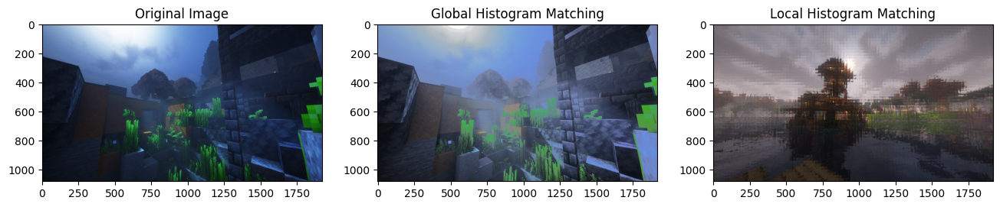

In [ ]:

plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Global Histogram Matching')
plt.imshow(matched_LAB)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matching')
plt.imshow(local_matched)
plt.show()
# Local histogram matching thường mang lại chi tiết tốt hơn trong các vùng tối hoặc sáng của ảnh so với global histogram matching, vì nó điều chỉnh histogram dựa trên các vùng nhỏ hơn.
# Global histogram matching có thể làm mất chi tiết trong các vùng có độ sáng lớn/ nhỏ do nó áp dụng một cách đồng nhất trên toàn bộ ảnh.
# => Local histogram matching thường cho kết quả tốt hơn trong việc phục hồi chi tiết ở các vùng tối hoặc sáng của ảnh.

Implement CLAHE (Contrast Limited Adaptive Histogram Equalization) using cv2 or skimage, and compare its results with your own local histogram matching method.

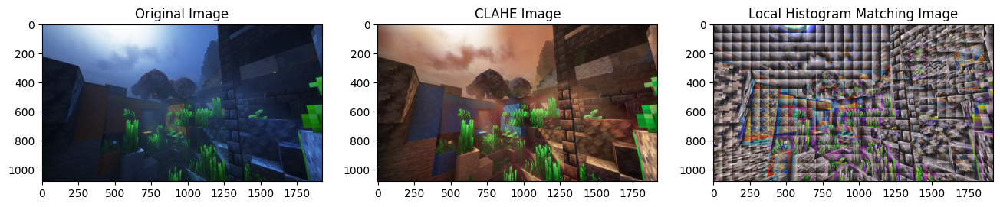

In [ ]:

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_RGB = np.zeros_like(newImg_RGB)
for i in range(3):
    clahe_RGB[:, :, i] = clahe.apply(cv2.cvtColor(newImg_RGB, cv2.COLOR_RGB2BGR)[:, :, i])
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('CLAHE Image')
plt.imshow(clahe_RGB)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matching Image')
plt.imshow(local_matched)
plt.show()

# CLAHE thường mang lại độ tương phản tốt hơn và chi tiết rõ ràng hơn so với phương pháp local histogram matching tự triển khai, đặc biệt là trong các vùng có độ sáng thấp.

Combine local histogram matching with adaptive gamma correction (compute a separate gamma value for each local region). Does this improve detail visibility in bright and dark areas

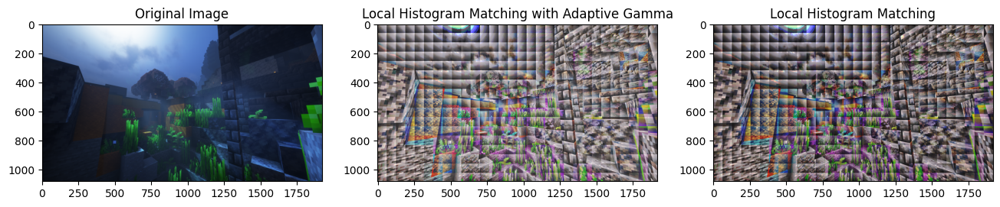

In [ ]:

def localHistoMatch_adaptiveGamma(src, ref, tile_size=64):
    src = img_as_float(src)
    ref = img_as_float(ref)

    h, w, _ = src.shape
    matched = np.zeros_like(src)

    for y in range(0, h, tile_size):
        for x in range(0, w, tile_size):
            y_end = min(y + tile_size, h)
            x_end = min(x + tile_size, w)

            region = src[y:y_end, x:x_end]

            # Histogram matching
            matched_region = exposure.match_histograms(region, ref, channel_axis=-1)

            # Adaptive gamma correction
            mean_intensity = np.mean(matched_region)
            gamma = np.log(0.5) / np.log(mean_intensity + 1e-10)  # Avoid log(0)
            matched_region = np.clip(matched_region ** gamma, 0, 1)

            matched[y:y_end, x:x_end] = matched_region
            
    return matched

localHistoMatch_adaptiveGamma_img = localHistoMatch_adaptiveGamma(newImg_RGB, copy_RGB, tile_size=64)
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Local Histogram Matching with Adaptive Gamma')
plt.imshow(localHistoMatch_adaptiveGamma_img)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matching')
plt.imshow(local_matched)
plt.show()

# Kết hợp local histogram matching với adaptive gamma correction giúp cải thiện độ rõ nét và chi tiết trong cả vùng sáng và tối của ảnh so với chỉ sử dụng local histogram matching.


## 5. Report
- Display the original image and all processed results after each transformation.

- Write a short report summarizing the observations and conclusions for each type of transformation.

### 5.1 Display the original image and all processed results after each transformation.

#### 5.1.1. Histogram Matching

Matched RGB Channels

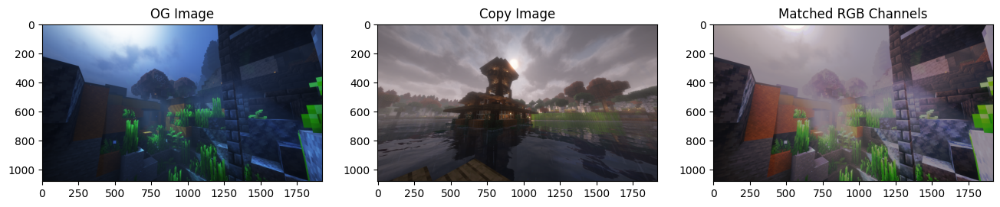

In [29]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Matched RGB Channels')
plt.imshow(matched_RGB)
plt.show()

Matched L Channel

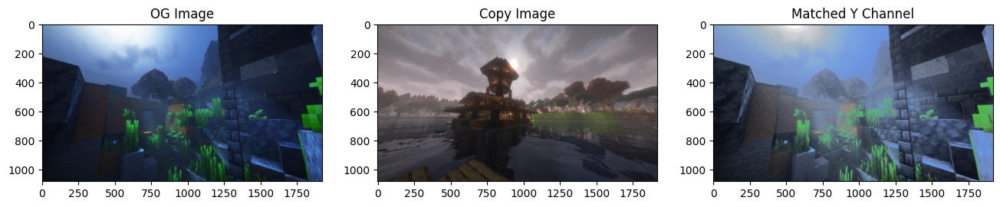

In [30]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Matched Y Channel')
plt.imshow(matched_YCrCb)
plt.show()

Matching process 2–3 times consecutively

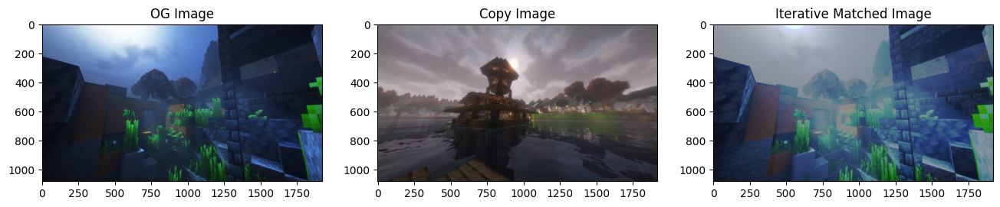

In [31]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Iterative Matched Image')
plt.imshow(iterativeMatched)
plt.show()

#### 5.1.2. Histogram Matching vs Equalization

Equalization and Matching

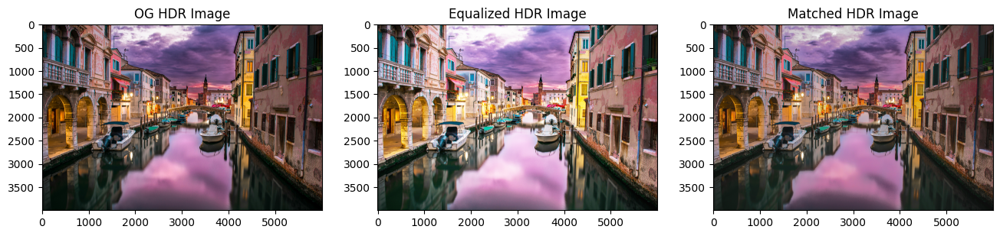

In [32]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG HDR Image')
plt.imshow(newHDR_RGB)
plt.subplot(1, 3, 2)
plt.title('Equalized HDR Image')
plt.imshow(equalized_HDR)
plt.subplot(1, 3, 3)
plt.title('Matched HDR Image')
plt.imshow(matched_HDR)
plt.show()

Matched -> Equalized and Equalized -> Matched

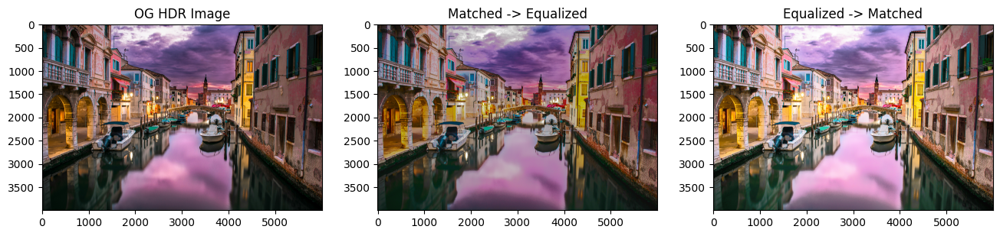

In [33]:
plt.figure(figsize=(16,8))
plt.subplot(1, 3, 1)   
plt.title('OG HDR Image')
plt.imshow(newHDR_RGB)
plt.subplot(1, 3, 2)
plt.title('Matched -> Equalized')
plt.imshow(matched_equalized)
plt.subplot(1, 3, 3)
plt.title('Equalized -> Matched')
plt.imshow(equalize_matched)
plt.show()

Histogram comparison

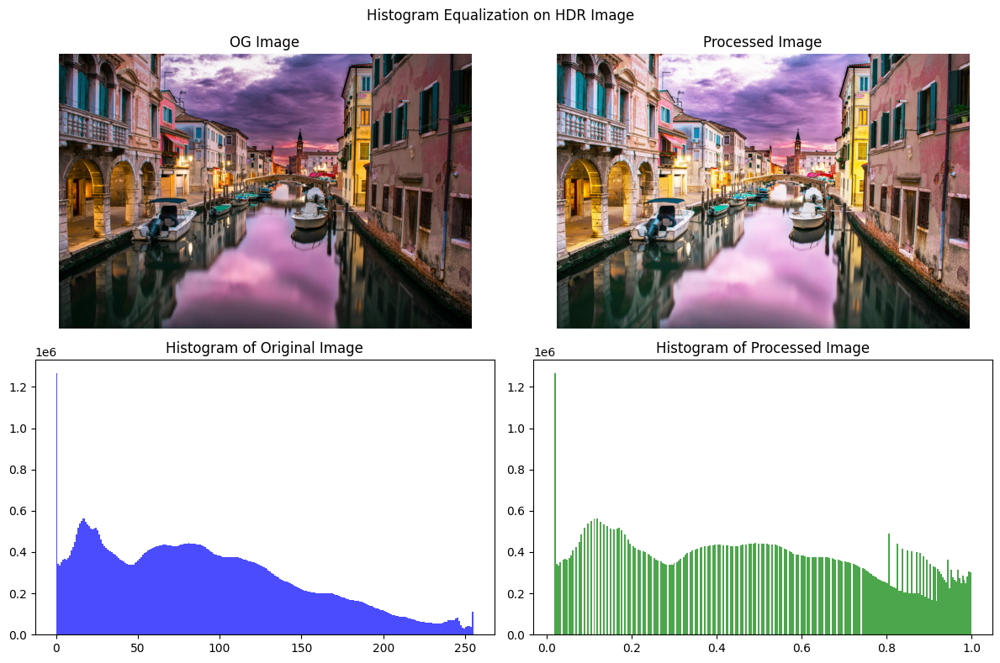

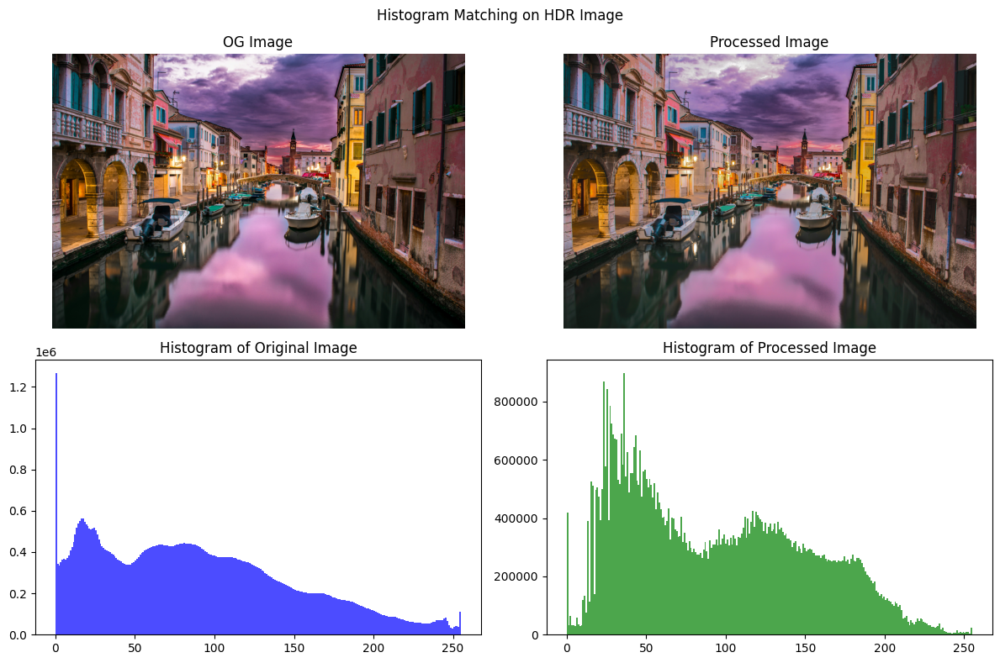

In [36]:
plotHistogramComparison(newHDR_RGB, equalized_HDR, 'Histogram Equalization on HDR Image')
plotHistogramComparison(newHDR_RGB, matched_HDR, 'Histogram Matching on HDR Image')

#### 5.1.3. Local Histogram Matching

Local Histogram Matched

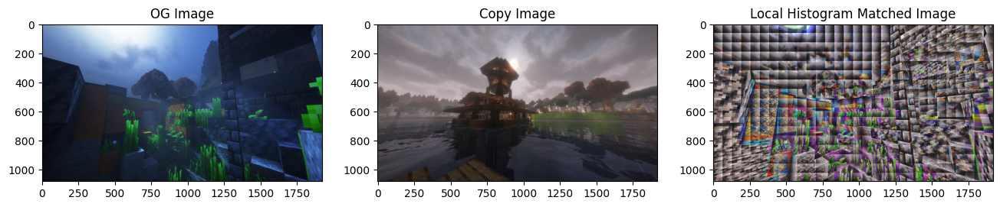

In [37]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('OG Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Copy Image')
plt.imshow(copy_RGB)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matched Image')
plt.imshow(local_matched)
plt.show()

CLAHE

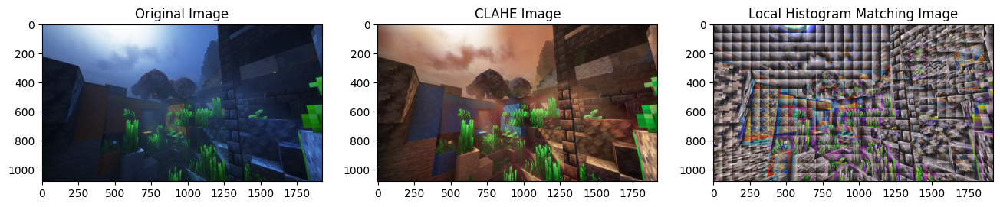

In [38]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('CLAHE Image')
plt.imshow(clahe_RGB)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matching Image')
plt.imshow(local_matched)
plt.show()


Combine local histogram matching with adaptive gamma correction

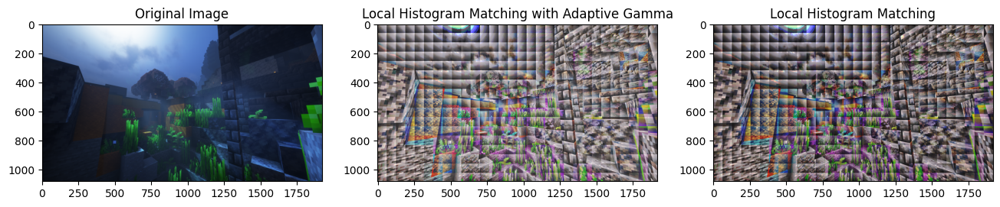

In [39]:
plt.figure(figsize=(16,4))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(newImg_RGB)
plt.subplot(1, 3, 2)
plt.title('Local Histogram Matching with Adaptive Gamma')
plt.imshow(localHistoMatch_adaptiveGamma_img)
plt.subplot(1, 3, 3)
plt.title('Local Histogram Matching')
plt.imshow(local_matched)
plt.show()


### 5.2. Write a short report summarizing the observations and conclusions for each type of transformation.

#### 5.2.1. Histogram Matching


1. Histogram Matching RGB Channels: Kết quả màu sắc ít tự nhiên nhất do không xem xét mối quan hệ giữa các kênh màu.
2. Histogram Matching YCrCb Channel: Cải thiện màu sắc so với RGB nhưng vẫn không tự nhiên bằng LAB.
3. Histogram Matching LAB Channel: Kết quả tự nhiên nhất do LAB mã hóa độ sáng phù hợp với mắt người.
4. Iterative Histogram Matching: Màu sắc bị thay đổi quá mức sau nhiều lần lặp lại, dẫn đến mất chi tiết màu sắc ban đầu.

#### 5.2.2. Histogram Matching vs Equalization

1. Histogram Equalization: Cải thiện độ tương phản và chi tiết trong vùng tối tốt hơn so với histogram matching.
2. Histogram Matching after Equalization vs Equalization after Histogram Matching: Thứ tự thao tác ảnh hưởng đáng kể đến kết quả cuối cùng, với việc equalization trước thường làm mất chi tiết màu sắc ban đầu.  

#### 5.2.3. Local Histogram Matching

1. Local Histogram Matching: Cung cấp chi tiết tốt hơn trong vùng tối/sáng so với global matching, nhưng có thể tạo ra hiệu ứng khối vuông.
2. CLAHE: Mang lại độ tương phản và chi tiết rõ ràng hơn so với local histogram matching tự triển khai.
3. Local Histogram Matching with Adaptive Gamma Correction: Cải thiện độ rõ nét và chi tiết trong cả vùng sáng và tối so với chỉ sử dụng local histogram matching.